# Generate Training Data

Given: 
- points on each building, with Building Class attributes (Shapefile, PLUTO)
- Satellite images, Resolution 0.5m 2022, NAIP covering all of NYC extents


Procedure: 
test for Brooklyn Only. 
- Select points covering extents of the Brooklyn NAIP image
- select a fixed bbox around each point. 
- Cut out images 

In [19]:
#load mappluto

import geopandas as gpd
import rasterio
from rasterio.mask import mask
from shapely.geometry import box
import os

import rasterio
from rasterio.mask import mask
from shapely.geometry import box
import matplotlib.pyplot as plt
import numpy as np


In [3]:
BK_Buildings = gpd.read_file('Data\BK_PLUTO.geojson\BK_PLUTO.geojson') #runs for 7 mins

In [9]:
satellite_image_path = 'Data/NAIP_BK_GEOTIFF.tif'

In [10]:
with rasterio.open(satellite_image_path) as src:
    # Ensure CRS match
    brooklyn_buildings = BK_Buildings.to_crs(src.crs)

    # Iterate over each building
    for idx, building in brooklyn_buildings.iterrows():
        # Compute an enlarged bounding box (120% area)
        geom = building['geometry']
        minx, miny, maxx, maxy = geom.bounds
        buffer_width = (maxx - minx) * 0.1  # 10% buffer on each side
        buffer_height = (maxy - miny) * 0.1  # 10% buffer on each side
        enlarged_bbox = box(minx - buffer_width, miny - buffer_height, maxx + buffer_width, maxy + buffer_height)

        # Mask the satellite image with the enlarged bounding box
        out_image, out_transform = mask(src, [enlarged_bbox], crop=True)

        # You might want to save or process the output image here; for now, let's just print the BldgClass
        print(f"Building Index: {idx}, BldgClass: {building['BldgClass']}")

        # Example to save the image (uncomment and modify path as needed)
        # out_meta = src.meta.copy()
        # out_meta.update({
        #    "driver": "GTiff",
        #    "height": out_image.shape[1],
        #    "width": out_image.shape[2],
        #    "transform": out_transform
        # })
        # output_path = f'output/building_{idx}.tif'
        # with rasterio.open(output_path, 'w', **out_meta) as dest:
        #    dest.write(out_image)


Building Index: 0, BldgClass: O6
Building Index: 1, BldgClass: U2
Building Index: 2, BldgClass: V1
Building Index: 3, BldgClass: V1
Building Index: 4, BldgClass: U2
Building Index: 5, BldgClass: O6
Building Index: 6, BldgClass: D7
Building Index: 7, BldgClass: D7
Building Index: 8, BldgClass: V0
Building Index: 9, BldgClass: U2
Building Index: 10, BldgClass: V0
Building Index: 11, BldgClass: V0
Building Index: 12, BldgClass: nan
Building Index: 13, BldgClass: V0
Building Index: 14, BldgClass: U4
Building Index: 15, BldgClass: G7
Building Index: 16, BldgClass: K1
Building Index: 17, BldgClass: Q1
Building Index: 18, BldgClass: Q1
Building Index: 19, BldgClass: U7
Building Index: 20, BldgClass: D3
Building Index: 21, BldgClass: Q2
Building Index: 22, BldgClass: D4
Building Index: 23, BldgClass: D3
Building Index: 24, BldgClass: Q1
Building Index: 25, BldgClass: O2
Building Index: 26, BldgClass: W9
Building Index: 27, BldgClass: U7
Building Index: 28, BldgClass: Q2
Building Index: 29, Bld

In [26]:
#filter buildings
#Exclude: 
# Define the BldgClass codes to exclude Open Space & Outdoor Recreation / Transportation & Utility /  Parking Facilities / Vacant Land
exclude_codes = ['G2', 'G3', 'G4', 'G5', 'G9', 'T', 'U', 'Y6', 'Y7', 'Y8', 'Y9', 'V', 'P4', 'P6', 'Q', 'Z8', 'G0','G1','G6','G7','RG','RP','Z2','nan'] 

# Filter out buildings with the specified BldgClass codes
# filtered_buildings = brooklyn_buildings[~brooklyn_buildings['BldgClass'].str.startswith(tuple(exclude_codes))]


In [27]:
import pandas as pd

# Convert the BldgClass column to strings (to ensure the startswith method works properly)
brooklyn_buildings['BldgClass'] = brooklyn_buildings['BldgClass'].astype(str)

# Filter out buildings with the specified BldgClass codes
# The startswith method is enclosed in a lambda function to handle NaN and other non-string data
filtered_buildings = brooklyn_buildings[
    ~brooklyn_buildings['BldgClass'].isna() &  # Keep rows where BldgClass is not NaN
    ~brooklyn_buildings['BldgClass'].apply(
        lambda x: any(x.startswith(code) for code in exclude_codes)
    )
]

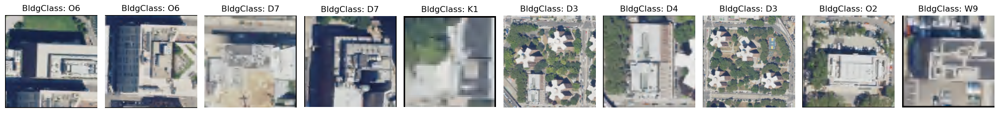

In [28]:
num_buildings_to_process = min(10, len(filtered_buildings))

# Prepare the subplots
fig, axs = plt.subplots(1, num_buildings_to_process, figsize=(20, 3))  # Adjust figsize as needed

# Open the satellite image
with rasterio.open(satellite_image_path) as src:
    # Iterate over the filtered buildings
    for idx in range(num_buildings_to_process):
        building = filtered_buildings.iloc[idx]

        # Compute a square bounding box with a 40% buffer
        geom = building['geometry']
        minx, miny, maxx, maxy = geom.bounds
        edge_length = max(maxx - minx, maxy - miny) * 1.2  # Adjust buffer as needed
        center_x, center_y = geom.centroid.x, geom.centroid.y
        half_edge = edge_length / 2
        square_bbox = box(center_x - half_edge, center_y - half_edge,
                          center_x + half_edge, center_y + half_edge)
        # Mask the satellite image with the square bounding box
        out_image, out_transform = mask(src, [square_bbox], crop=True)

        # Check if the image is not empty
        if out_image.size == 0:
            continue
        
        # Stack the bands to create an RGB image
        # Note: The order of bands might need to be adjusted depending on the satellite image
        # Typically, the order is (Red, Green, Blue), but it can vary
        rgb_image = np.stack((out_image[0], out_image[1], out_image[2]), axis=-1)

        # Plotting in the respective subplot
        ax = axs[idx]
        ax.imshow(rgb_image)
        ax.set_title(f"BldgClass: {building['BldgClass']}")
        ax.axis('off')  # Hide axis

plt.tight_layout()
plt.show()

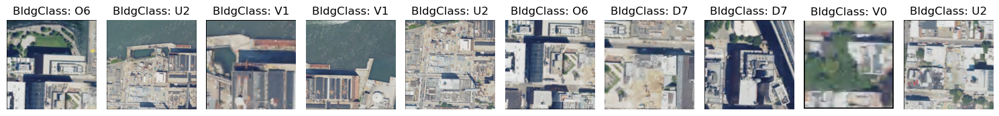

In [18]:
# import rasterio
# from rasterio.mask import mask
# from shapely.geometry import box
# import matplotlib.pyplot as plt
# import numpy as np

# # Assuming 'brooklyn_buildings' and 'satellite_image_path' are already defined

# num_buildings_to_process = min(10, len(brooklyn_buildings))

# # Prepare the subplots
# fig, axs = plt.subplots(1, num_buildings_to_process, figsize=(15, 3))  # Adjust figsize as needed

# # Open the satellite image
# with rasterio.open(satellite_image_path) as src:
#     # Iterate over the first 5 buildings
#     for idx in range(num_buildings_to_process):
#         building = brooklyn_buildings.iloc[idx]

#         # Compute a square bounding box with a 40% buffer
#         geom = building['geometry']
#         minx, miny, maxx, maxy = geom.bounds
#         edge_length = max(maxx - minx, maxy - miny) * 2  # 20% buffer on the longer edge
#         center_x, center_y = geom.centroid.x, geom.centroid.y
#         half_edge = edge_length / 2
#         square_bbox = box(center_x - half_edge, center_y - half_edge,
#                           center_x + half_edge, center_y + half_edge)

#         # Mask the satellite image with the square bounding box
#         out_image, out_transform = mask(src, [square_bbox], crop=True)

#         # Check if the image is not empty
#         if out_image.size == 0:
#             continue
        
#         # Stack the bands to create an RGB image
#         # Note: The order of bands might need to be adjusted depending on the satellite image
#         # Typically, the order is (Red, Green, Blue), but it can vary
#         rgb_image = np.stack((out_image[0], out_image[1], out_image[2]), axis=-1)

#         # Plotting in the respective subplot
#         ax = axs[idx]
#         ax.imshow(rgb_image)
#         ax.set_title(f"BldgClass: {building['BldgClass']}")
#         ax.axis('off')  # Hide axis

# plt.tight_layout()
# plt.show()
